# Init

In [45]:
import os
import sys
import cv2
import math
import time
import cmath
import random
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
sys.setrecursionlimit(1000000)

In [46]:
class Image:
    def __init__(self):
        self.img=""
    def read_local_img(self,path,val=0):
        self.img = cv2.imread(path)
        if(val==0):
            self.img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)
    def bgr_to_rgb(self):
        self.img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)
    def grayscale(self):
        self.img = cv2.imread(self.img, cmap="gray")
    def print_img(self,fig_size=[0,0],axis_bool=False):
        if fig_size != [0,0]:
            plt.figure(figsize = [fig_size[0],fig_size[1]])
        plt.imshow(self.img)
        if(axis_bool==False):
            plt.axis('off')
        plt.show()
        
class Subplot:
    def __init__(self):
        self.x=1
        self.y=1
        self.fig=[16,16]
        self.arr=1
        self.tot=1
        self.tit=[]

    def print_img_subplot(self,x,y,fi,tot,arr,tit,axis_bool=False):
        self.x=x
        self.y=y
        self.fig=fi
        self.arr=arr
        self.tot=tot
        self.tit=tit
        fig = plt.figure(figsize=(self.fig[0],self.fig[0]))
        for i in range(0,self.tot):
            ax = fig.add_subplot(self.x,self.y,1+i)
            ax.imshow(arr[i],cmap='gray')
            ax.title.set_text(self.tit[i])
            if(axis_bool==False):
                ax.axis('off')

    def print_img_subplot2(self,x,y,fi,tot,arr,axis_bool=False):
        self.x=x
        self.y=y
        self.fig=fi
        self.arr=arr
        self.tot=tot
        f, axarr = plt.subplots(x,y)
        for i in range(0,tot):
            axarr[i//x,i%y].imshow(arr[i])

def bilateral_filter(img,a,b,c):
    return cv2.bilateralFilter(img,a,b,c)

def cmp(img1,img2):
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            if(img1[i][j]!=img2[i][j]):
                return False
    return True


In [47]:
def layered_img(img):
    layere1=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    layere2=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    layere3=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            layere1[i][j][0]=img[i][j][0]
            layere2[i][j][1]=img[i][j][1]
            layere3[i][j][2]=img[i][j][2]
    return layere1,layere2,layere3

def delayer_img(l1,l2,l3):
    arr=np.zeros((l1.shape[0],l1.shape[1],3)).astype(np.uint8)
    for i in range(0,l1.shape[0]):
        for j in range(0,l2.shape[1]):
            arr[i][j][0]=l1[i][j]
            arr[i][j][1]=l2[i][j]
            arr[i][j][2]=l3[i][j]
    return arr.astype(np.uint8)


In [48]:
def Rpad(img):
    arr=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    arr[:,:,0]=img
    return arr

def Gpad(img):
    arr=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    arr[:,:,1]=img
    return arr

def Bpad(img):
    arr=np.zeros((img.shape[0],img.shape[1],3)).astype(np.uint8)
    arr[:,:,2]=img
    return arr

In [49]:
def erossion(img,k,fil,aaa):
    kk=k//2
    if fil==-1:
        img=np.array(img)
        fil=np.zeros((k,k))
        fil.fill(1)
        fil=fil.astype(int)
    else:
        fil=aaa
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            arr[i][j]=img[i][j]
    for i in range(kk, img.shape[0]-kk):
        for j in range(kk,img.shape[1]-kk):
            arr1= img[i-kk:i+kk+1, j-kk:j+kk+1]
            arr1= arr1*fil
            arr[i,j]= np.min(arr1)
    return arr

def dilation(img,k,fil,aaa):
    kk=k//2
    if fil==-1:
        img=np.array(img)
        fil=np.zeros((k,k))
        fil.fill(1)
        fil=fil.astype(int)
    else:
        fil=aaa
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            arr[i][j]=img[i][j]
    for i in range(kk, img.shape[0]-kk):
        for j in range(kk,img.shape[1]-kk):
            arr1= img[i-kk:i+kk+1, j-kk:j+kk+1]
            arr1= arr1*fil
            arr[i,j]= np.max(arr1)
    return arr

def opening(img,k,fil,aaa):
    img=erossion(img,k,fil,aaa)
    img=dilation(img,k,fil,aaa)
    return img

def closing(img,k,fil,aaa):
    img=dilation(img,k,fil,aaa)
    img=erossion(img,k,fil,aaa)
    return img

def morphological_gradient(img,k,fil,aaa):
    img1=dilation(img,k,fil,aaa)
    img2=erossion(img,k,fil,aaa)
    return img1-img2

In [50]:
def dft_2d(img):
    arr=np.zeros((img.shape[0],img.shape[1]),dtype=complex)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            val=0.0
            for k in range(0,img.shape[0]):
                for l in range(0,img.shape[1]):
                    val+=img[k,l]*cmath.exp(-2j*math.pi*(k*i/img.shape[0]+l*j/img.shape[1]))
            arr[i][j]=val
    return arr

def idft_2d(img):
    arr=np.zeros((img.shape[0],img.shape[1]),dtype=complex)
    for i in range(0,img.shape[0]):
        for j in range(0,img.shape[1]):
            val=0.0
            for k in range(0,img.shape[0]):
                for l in range(0,img.shape[1]):
                    val+=img[k,l]*cmath.exp(2j*math.pi*(k*i/img.shape[0]+l*j/img.shape[1]))
            arr[i][j]=val/img.shape[0]/img.shape[1]
    return arr


def fft_1d_op(arr):
    N = len(arr)
    wt = cmath.exp(-2j*math.pi/N)
    if N > 1:
        arr = fft_1d_op(arr[::2]) + fft_1d_op(arr[1::2])
        for k in range(0,N//2):
            tt = arr[k]
            arr[k] = tt + (wt**k)*arr[k+N//2]
            arr[k+N//2] = tt - (wt**k)*arr[k+N//2]
    return arr

def fft_2d(img):
    arr=np.zeros((img.shape[0],img.shape[1]),dtype=complex)
    for i in range(0,img.shape[0]):
        arr[i]=fft_1d_op(img[i].tolist())
    arr=arr.transpose()
    brr=np.zeros((img.shape[1],img.shape[0]),dtype=complex)
    for i in range(img.shape[1]):
        brr[i]=fft_1d_op(arr[i].tolist())
    arr=brr.transpose()
    return arr

def sqcmp(img):
    tt= (np.sqrt(np.square(img.real)+np.square(img.imag)))
    return tt.astype(np.uint8)

def ifft_1d(arr):
    N = len(arr)
    wt = cmath.exp(2j*math.pi/N)
    if N > 1:
        arr = ifft_1d(arr[::2]) + ifft_1d(arr[1::2])
        for k in range(0,N//2):
            tt = arr[k]
            arr[k] = tt + (wt**k)*arr[k+N//2]
            arr[k+N//2] = tt - (wt**k)*arr[k+N//2]
    return arr

def ifft_1d_op(arr):
    tt=ifft_1d(arr)
    for i in range(0,len(arr)):
        tt[i]=tt[i]/len(tt)
    return tt

def ifft_2d(img):
    arr=np.zeros((img.shape[0],img.shape[1]),dtype=complex)
    for i in range(0,img.shape[0]):
        arr[i]=ifft_1d(img[i].tolist())
    arr=arr.transpose()
    brr=np.zeros((img.shape[1],img.shape[0]),dtype=complex)
    for i in range(img.shape[1]):
        brr[i]=fft_1d_op(arr[i].tolist())
    arr=brr.transpose()
    brr=np.zeros((arr.shape[0],arr.shape[1]),dtype=complex)
    for i in range(arr.shape[0]):
        brr[arr.shape[0]-i-1]=arr[i]
    return brr

def erosion(img,k1,k2,i):
    return cv2.erode(img,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(k1,k2)),iterations=i)

def dilate(img,k1,k2,i):
    return cv2.dilate(img,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(k1,k2)),iterations=i)

def dis(a,b,c,d):
    return math.sqrt((a-c)**2+(b-d)**2)

def dis2(a,b,c,d):
    return ((a-c)**2+(b-d)**2)

def fftshift(img):
    n=img.shape[0]
    m=img.shape[1]
    arr=np.zeros((img.shape[0],img.shape[1]),dtype=complex)
    for i in range(0,n):
        for j in range(0,m):
            arr[i][j]=img[(i+n//2)%n][(j+m//2)%m]
    return arr

def apply(img,fil,n,m,mag=False,ret=False):
    
    img=cv2.resize(img,(n,m))
    img=fftshift(fft_2d(img))
    if mag==True:
        magnitude_spectrum = 20 * np.log(cv2.magnitude(img.real, img.imag)+1)
        if ret==False:
            plt.imshow(magnitude_spectrum,cmap='gray')
            plt.show()
    img.real=img.real*fil
    img.imag=img.imag*fil
    if mag==True:
        magnitude_spectrum2 = 20 * np.log(cv2.magnitude(img.real, img.imag)+1)
        if ret==False:
            plt.imshow(magnitude_spectrum2,cmap='gray')
            plt.show()
    img=ifft_2d(fftshift(img))
    img.real=img.real/img.real.max()
    img.imag=img.imag/img.imag.max()
    img=(img.real**2+img.imag**2)**0.5
    if ret==True:
        return img.real,magnitude_spectrum,magnitude_spectrum2
    else :
        return img.real




# Question 1

## part 1

In [51]:
def median_filter(img,k):
    aa=time.time()
    arr=np.zeros((img.shape[0],img.shape[1]))
    arr1=np.zeros((img.shape[0],img.shape[1]))
    arr.fill(255)
    arr1.fill(255)
    for i in range(0,img.shape[0]-k+1):
        for j in range(0,img.shape[1]-k+1):
            if j==0 :
                arr=img[i:i+k,j:j+k].flatten().tolist()
            else:
                for c in range(0,k):
                    arr.remove(img[i+c][j-1])
                    arr.append(img[i+c][j+k-1])
            arr.sort()
            arr1[i+k//2][j+k//2]=arr[len(arr)//2]
    return arr1,time.time()-aa

In [52]:
NoisySimba=Image()
NoisySimba.read_local_img("../images/NoisySimba.png")

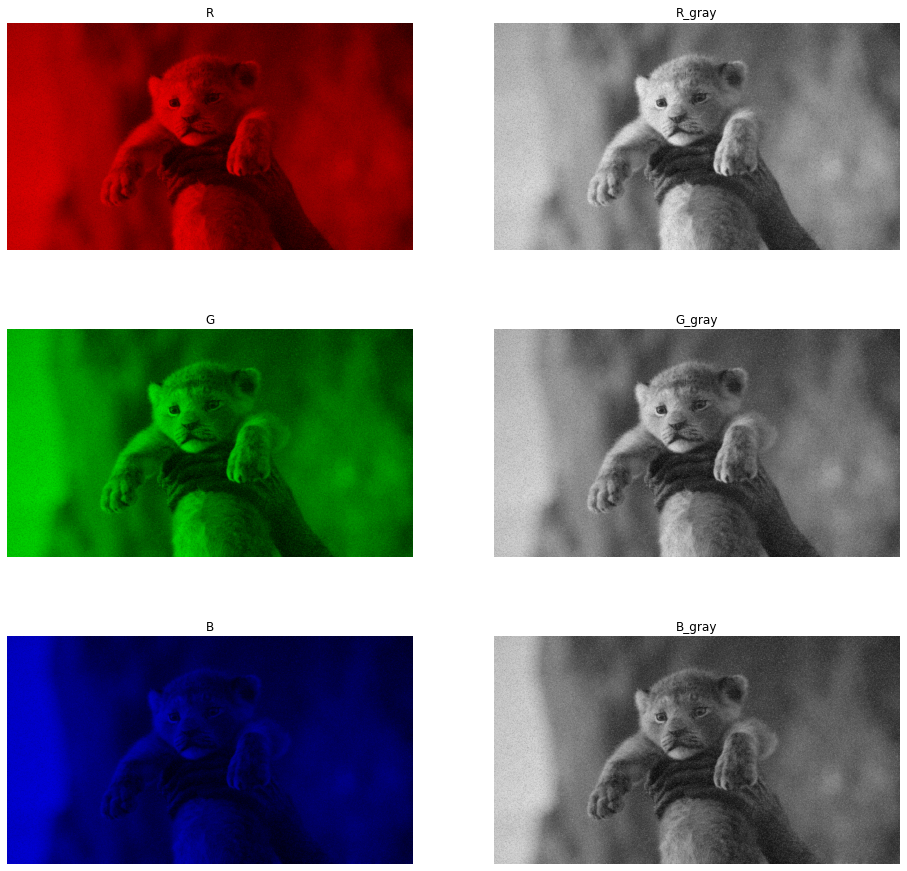

In [53]:
l1,l2,l3=layered_img(NoisySimba.img)
ss=Subplot()
ss.print_img_subplot(3,2,(16,16),6,[l1,l1[:,:,0],l2,l2[:,:,1],l3,l3[:,:,2]],["R","R_gray","G","G_gray","B","B_gray"])

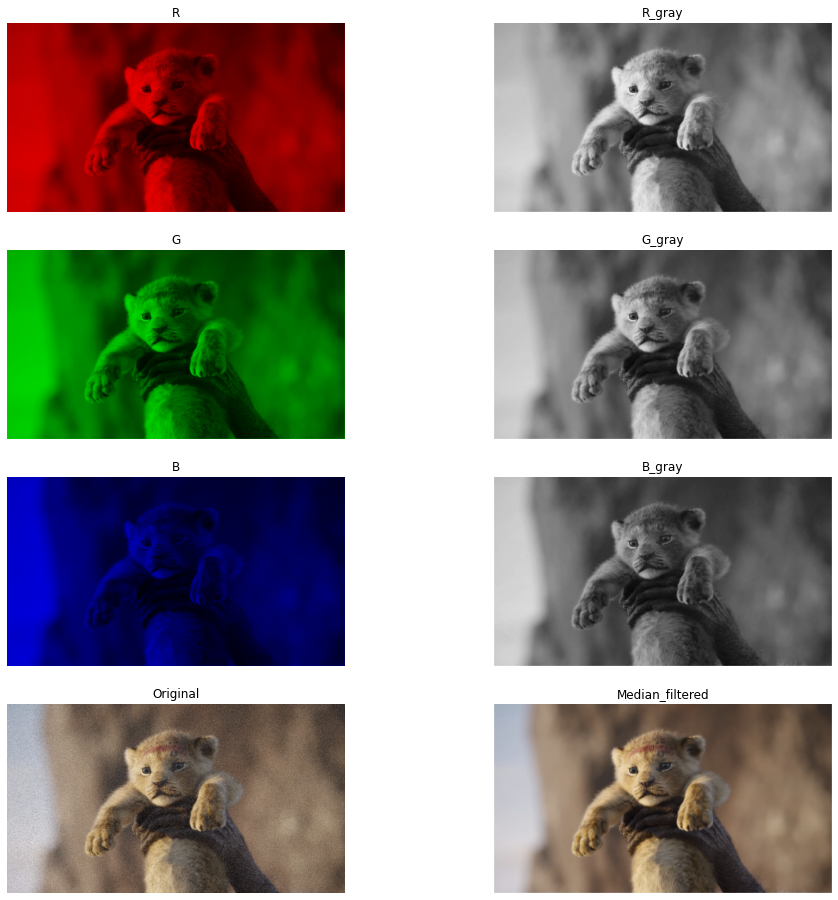

In [54]:
l11,a=median_filter(l1[:,:,0],3)
l21,a=median_filter(l2[:,:,1],3)
l31,a=median_filter(l3[:,:,2],3)
l4=delayer_img(l11,l21,l31)
ss.print_img_subplot(4,2,(16,16),8,[Rpad(l11),l11,Gpad(l21),l21,Bpad(l31),l31,NoisySimba.img,l4],["R","R_gray","G","G_gray","B","B_gray","Original","Median_filtered"])

## part 2

In [55]:
def my_histogram(img):
    arr=np.zeros(256)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr[img[i][j]]+=1
    return arr

def colorLinContrastStreching(img):
    l1=my_histogram(img[:,:,0])
    l2=my_histogram(img[:,:,1])
    l3=my_histogram(img[:,:,2])
    a=np.zeros(256)
    for i in range(256):
        a[i]=i
    plt.plot(a,l1,color='red')
    plt.plot(a,l2,color='green')
    plt.plot(a,l3,color='blue')
    plt.legend(["R","G","B"])
    plt.show()

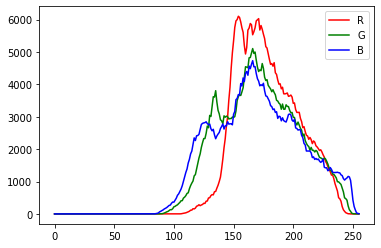

In [56]:
fog=Image()
fog.read_local_img("../images/fog.jpeg")
colorLinContrastStreching(fog.img)
fog1=Image()
fog1.read_local_img("../images/fog.jpeg")

In [57]:
mini=fog.img[:,:,0].min()
maxi=fog.img[:,:,0].max()
delta = maxi-mini
mini=mini+0.02*delta
maxi=maxi-0.02*delta
m=255/(maxi-mini)
fog.img[:,:,0]=(fog.img[:,:,0]-mini)*m

mini=fog.img[:,:,1].min()
maxi=fog.img[:,:,1].max()
delta = maxi-mini
mini=mini+0.02*delta
maxi=maxi-0.02*delta
m=255/(maxi-mini)
fog.img[:,:,1]=(fog.img[:,:,1]-mini)*m

mini=fog.img[:,:,2].min()
maxi=fog.img[:,:,2].max()
delta = maxi-mini
mini=mini+0.02*delta
maxi=maxi-0.02*delta
m=255/(maxi-mini)
fog.img[:,:,2]=(fog.img[:,:,2]-mini)*m

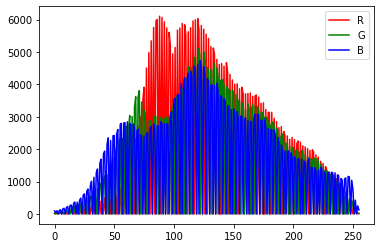

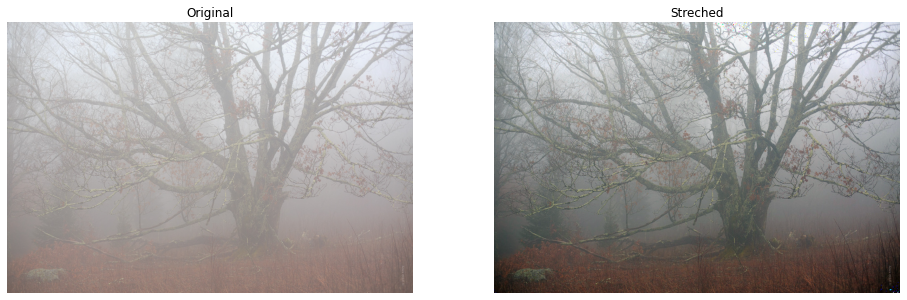

In [58]:
colorLinContrastStreching(fog.img)
ss.print_img_subplot(1,2,[16,16],2,[fog1.img,fog.img],["Original","Streched"])

## part 3

In [59]:
fog=Image()
fog.read_local_img("../images/fog.jpeg")

In [60]:
def padd(img,pp):
    if pp=="R":
        return Rpad(img)
    if pp=="G":
        return Gpad(img)
    if pp=="B":
        return Bpad(img)

class Hist:
    def __init__(self,img,pp):
        self.img=img
        self.count_arr=[]
        self.npdf=[]
        self.ncdp=[]
        self.ii=np.arange(256)
        self.img2=self.cp()
        self.count_arr2=[]
        self.npdf2=[]
        self.ncdp2=[]
        self.pp=pp
        
    def cp(self):
        arr=np.zeros((self.img.shape[0],self.img.shape[1]),dtype=np.uint8)
        for i in range(self.img.shape[0]):
            for j in range(self.img.shape[1]):
                    arr[i][j]=self.img[i][j]
        return arr
        
    def my_histogram(self,val=1):
        arr=np.zeros(256)
        if val==1:
            for i in range(self.img.shape[0]):
                for j in range(self.img.shape[1]):
                    arr[self.img[i][j]]+=1
            self.count_arr=arr
        else:
            for i in range(self.img2.shape[0]):
                for j in range(self.img2.shape[1]):
                    arr[self.img2[i][j]]+=1
            self.count_arr2=arr

    def histEqaulization_2helper(self):
        for i in range(self.img2.shape[0]):
            for j in range(self.img2.shape[1]):
                cc=self.ncdf[self.img2[i][j]]
                cc= 255*cc
                self.img2[i][j]=cc
                np.clip(self.img2[i][j],0,255)
        self.img2=self.img2.astype(np.uint8)

    def histEqaulization_1helper(self,val=1):
        if val==1:
            self.my_histogram()
            arr=np.zeros(256)
            hist=self.count_arr
            arr[0]=hist[0]
            for i in range(1,256):
                arr[i]=hist[i]+arr[i-1]
            hh=max(hist)
            aa=max(arr)
            for i in range(0,256):
                hist[i]=hist[i]/hh
                arr[i]=arr[i]/aa
            self.npdf=hist
            self.ncdf=arr
        else :
            self.my_histogram(2)
            arr=np.zeros(256)
            hist=self.count_arr2
            
            arr[0]=hist[0]
            for i in range(1,256):
                arr[i]=hist[i]+arr[i-1]
            aa=max(arr)
            for i in range(0,256):
                hist[i]=hist[i]/aa
                arr[i]=arr[i]/aa
            self.npdf2=hist
            self.ncdf2=arr
        
    def histEqaulization(self):
        self.histEqaulization_1helper()
        self.histEqaulization_2helper()
        
    def print_4(self):
        self.histEqaulization_1helper(2)
        fig = plt.figure(figsize=(16,16))
        
        ax1 = fig.add_subplot(331)
        ax1.imshow(padd(self.img,self.pp))
        ax1.axis('off')
        ax1.title.set_text(self.pp+" Image")
        
        ax2 = fig.add_subplot(332)
        ax2.imshow(self.img,cmap='gray')
        ax2.axis('off')
        ax2.title.set_text(self.pp+"_gray Image")
        
        ax3 = fig.add_subplot(333)
        ax3.bar(self.ii,self.npdf)
        ax3.plot(self.ii,self.ncdf)
        ax3.title.set_text("PDF and CDF plot of "+self.pp+" Image")
        
        ax4 = fig.add_subplot(334)
        ax4.imshow(padd(self.img2,self.pp))
        ax4.axis('off')
        ax4.title.set_text("Equalized "+self.pp+"Image")
        
        ax4 = fig.add_subplot(335)
        ax4.imshow(self.img2,cmap='gray')
        ax4.axis('off')
        ax4.title.set_text("Equalized "+self.pp+"_gray Image")
        
        ax6 = fig.add_subplot(336)
        ax6.bar(self.ii,self.npdf2)
        ax6.plot(self.ii,self.ncdf2)
        ax6.title.set_text("PDF and CDF plot of Equalized "+self.pp+" Image")
        
        plt.show()


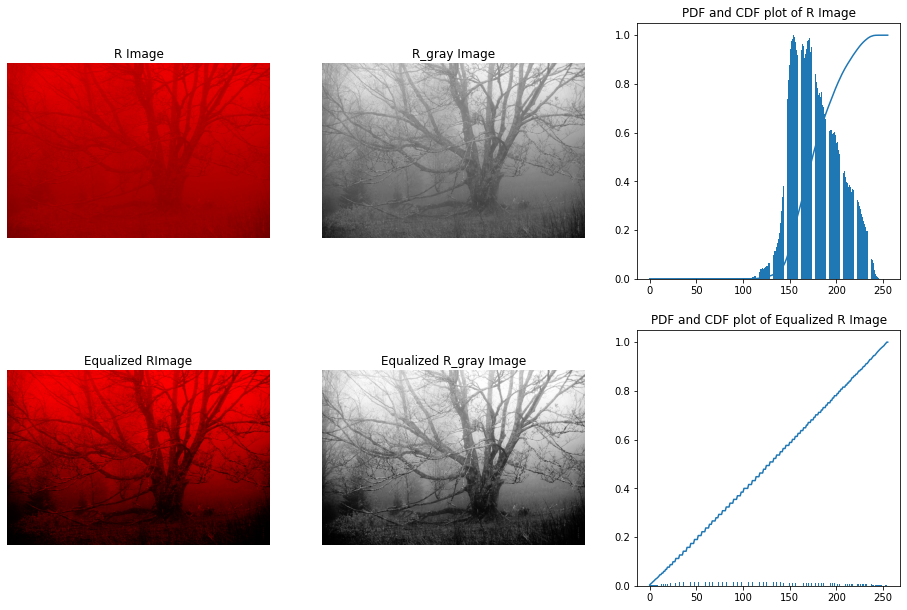

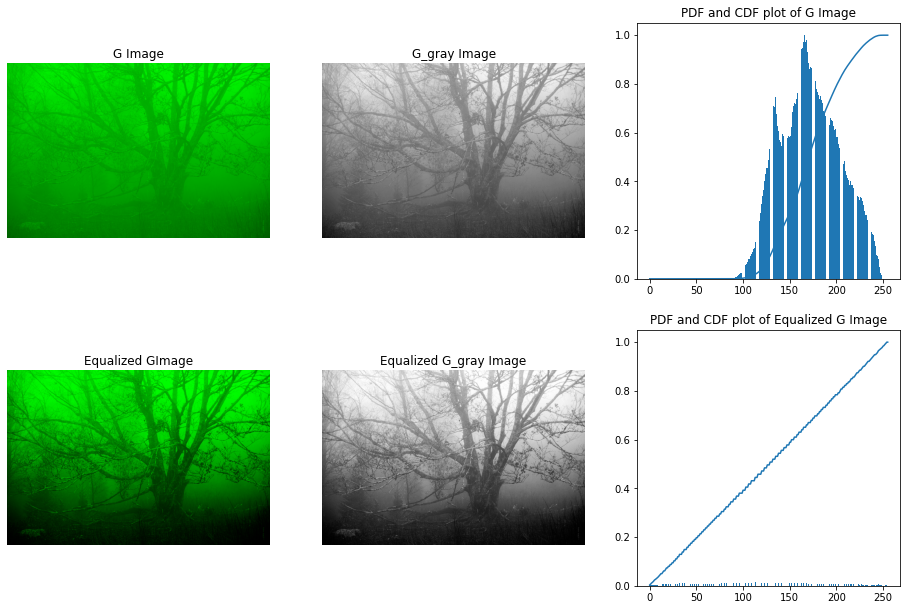

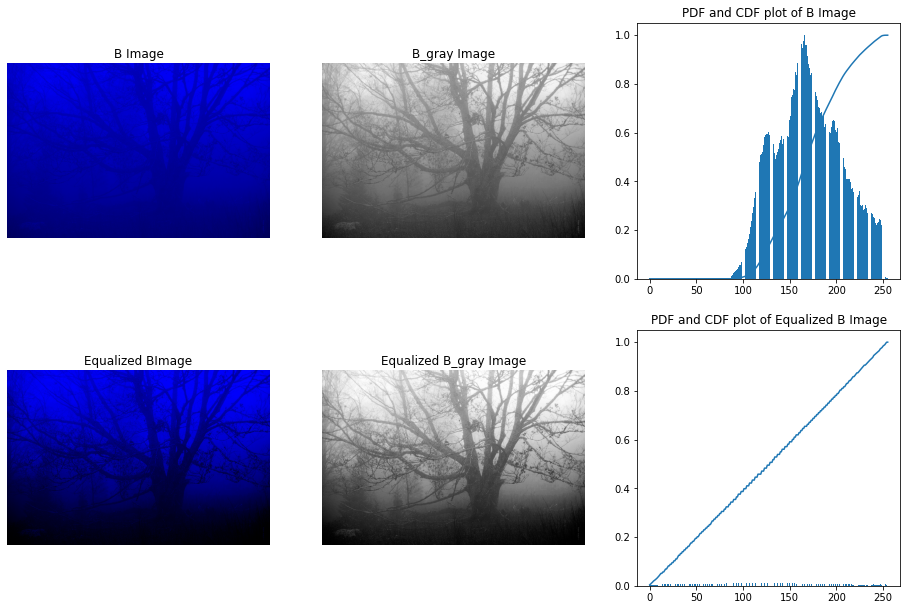

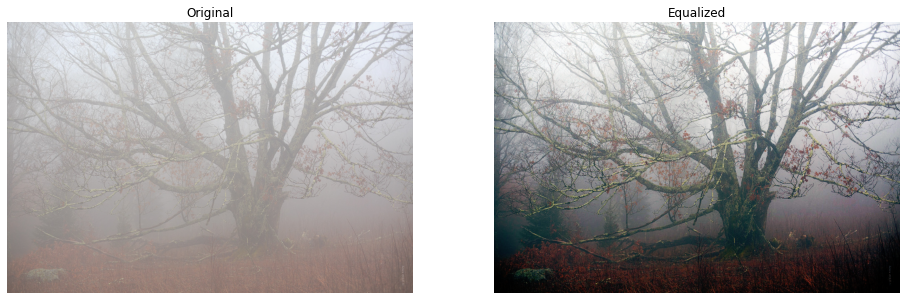

In [61]:
img1=Hist(fog.img[:,:,0],"R")
img1.histEqaulization()
img1.print_4()
img2=Hist(fog.img[:,:,1],"G")
img2.histEqaulization()
img2.print_4()
img3=Hist(fog.img[:,:,2],"B")
img3.histEqaulization()
img3.print_4()
img=delayer_img(img1.img2,img2.img2,img3.img2)
ss.print_img_subplot(1,2,[16,16],2,[fog.img,img],["Original","Equalized"])


## part 4

In [62]:
matrix=Image()
matrix.read_local_img("../images/matrix.png")

### Vintage

In [63]:
def vintage(img,d=2.5):
    arr=np.zeros((img.shape[0],img.shape[1],3))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr[i][j][0]=(0.393*img[i][j][0]+0.769*img[i][j][1]+0.189*img[i][j][2])
            arr[i][j][1]=(0.349*img[i][j][0]+0.686*img[i][j][1]+0.168*img[i][j][2])
            arr[i][j][2]=(0.272*img[i][j][0]+0.534*img[i][j][1]+0.131*img[i][j][2])
    arr[np.where(arr > 255)] = 255 
    arr = np.array(arr, dtype=np.uint8)
    return arr

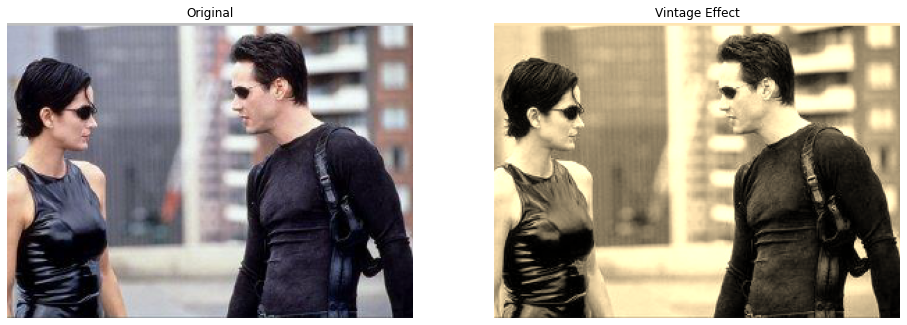

In [64]:
img_vin =vintage(matrix.img)
ss.print_img_subplot(1,2,[16,16],2,[matrix.img,img_vin],["Original","Vintage Effect"])


### Matrix effect

In [65]:
def clip(val):
    val = math.floor(val)
    return val

def matrix_effect(img):
    arr=np.zeros((img.shape[0],img.shape[1],3))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr[i][j][0]=clip(img[i][j][0]**(1.5))
            arr[i][j][1]=clip(img[i][j][1]**(0.8))
            arr[i][j][2]=clip(img[i][j][2]**(1.5))
    arr[:,:,0] = (arr[:,:,0]/np.max(arr[:,:,0]))
    arr[:,:,1] = (arr[:,:,1]/np.max(arr[:,:,1]))
    arr[:,:,2] = (arr[:,:,2]/np.max(arr[:,:,2]))
    return arr

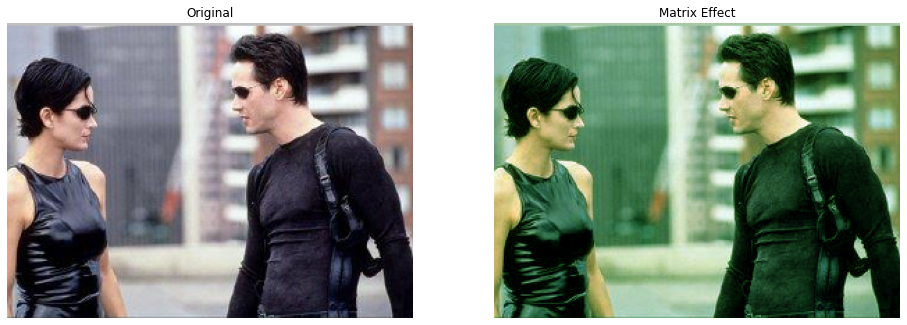

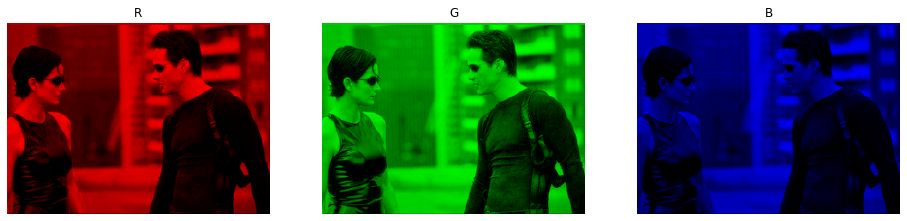

In [66]:
img=matrix_effect(matrix.img)
ss.print_img_subplot(1,2,[16,16],2,[matrix.img,img],["Original","Matrix Effect"])
ss.print_img_subplot(1,3,[16,16],3,[Rpad(255*img[:,:,0]),Gpad(255*img[:,:,1]),Bpad(255*img[:,:,2])],["R","G","B"])

### Vignetting

In [67]:
def vin_tex(n,m,d):
    arr=np.zeros((n,m))
    k=n+m
    k1=n/k
    k2=m/k
    for i in range(n):
        for j in range(m):
            cc= d*(m*m*(i-n/2)*(i-n/2)+n*n*(j-m/2)*(j-m/2))/(n*n+m*m)
            arr[i][j]=n*m-cc
            if arr[i][j]<0:
                arr[i][j]=0
    arr=arr/np.max(arr)
    return arr

def vignetting(img,d=2.5):
    arr=np.zeros((img.shape[0],img.shape[1],3))
    brr=vin_tex(img.shape[0],img.shape[1],d)
    for i in range(img.shape[2]):
        arr[:,:,i]=(img[:,:,i]*brr)
    arr=arr/np.max(arr)
    return arr,brr

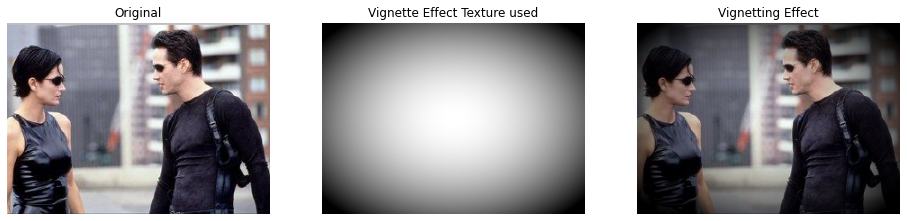

In [68]:
img,arrr=vignetting(matrix.img,5)
ss.print_img_subplot(1,3,[16,16],3,[matrix.img,arrr,img],["Original","Vignette Effect Texture used","Vignetting Effect"])

### Duotone

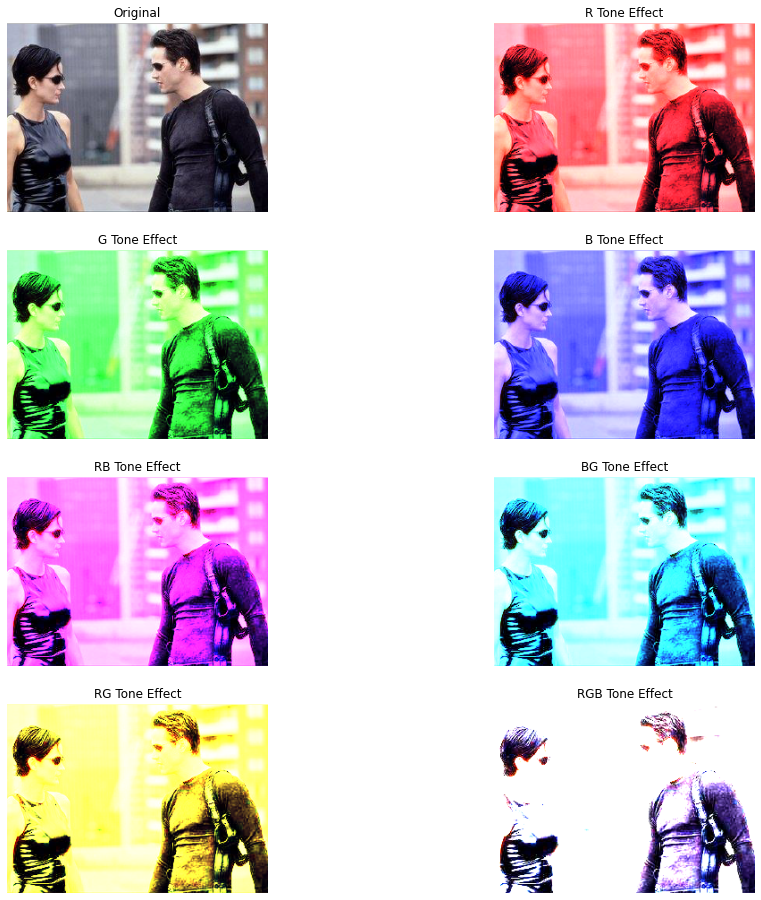

In [69]:
def exponential_function(channel, exp):
    table = np.array([min((i**exp), 255) for i in np.arange(0, 256)]).astype("uint8") 
    channel = cv2.LUT(channel, table)
    return channel

def tone(img1, pp):
    img=np.zeros((img1.shape[0],img1.shape[1],3),dtype=np.uint8)
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            img[i][j][0]=img1[i][j][0]
            img[i][j][1]=img1[i][j][1]
            img[i][j][2]=img1[i][j][2]
    if pp=="R":
        img[:, :, 0] = exponential_function(img[:, :, 0], 1.5)
    elif pp=="G":
        img[:, :, 1] = exponential_function(img[:, :, 1], 1.5)
    elif pp=="B":
        img[:, :, 2] = exponential_function(img[:, :, 2], 1.5)
    elif pp=="RG" or pp=="GR":
        img[:, :, 0] = exponential_function(img[:, :, 0], 1.5)
        img[:, :, 1] = exponential_function(img[:, :, 1], 1.5)
    elif pp=="RB" or pp=="BR":
        img[:, :, 0] = exponential_function(img[:, :, 0], 1.5)
        img[:, :, 2] = exponential_function(img[:, :, 2], 1.5)
    elif pp=="GB" or pp=="BG":
        img[:, :, 2] = exponential_function(img[:, :, 2], 1.5)
        img[:, :, 1] = exponential_function(img[:, :, 1], 1.5)
    else :
        img[:, :, 0] = exponential_function(img[:, :, 0], 1.5)
        img[:, :, 1] = exponential_function(img[:, :, 1], 1.5)
        img[:, :, 2] = exponential_function(img[:, :, 2], 1.5)
    img[:,:,0] = (img[:,:,0]/np.max(img[:,:,0]))*255
    img[:,:,1] = (img[:,:,1]/np.max(img[:,:,1]))*255
    img[:,:,2] = (img[:,:,2]/np.max(img[:,:,2]))*255
    return img

ss.print_img_subplot(4,2,[16,16],8,[matrix.img,tone(matrix.img, "R"),tone(matrix.img, "G"),tone(matrix.img, "B"),tone(matrix.img, "RB"),tone(matrix.img, "BG"),tone(matrix.img, "GR"),tone(matrix.img, "RBG")],["Original","R Tone Effect","G Tone Effect","B Tone Effect","RB Tone Effect","BG Tone Effect","RG Tone Effect","RGB Tone Effect"])

# Question 2

## part 1

In [70]:
colors = []
for i in range(300):
    colors.append([random.randint(0,255),random.randint(0,255),random.randint(0,255)])

def LaberOrdering(image):
    result_img = np.zeros(image.shape)
    ord_ = {}
    n = image.shape[0]
    m = image.shape[1]
    uniques = np.unique(image)
    for i in range(len(uniques)):
        ord_[uniques[i]] = i
    
    for i in range(n):
        for j in range(m):
            result_img[i][j] = ord_[image[i][j]]
    
    return result_img

def add_color(image):
    global colors
    new_image = np.zeros((image.shape[0], image.shape[1], 3))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if  image[i][j]:
                new_image[i][j] = colors[image[i][j]]
    return new_image.astype(np.uint8)

def one_th_Pass_comp(image, k):
    parent_lst = {0:0} 
    count = 0 
    result_img = np.zeros(image.shape)
    for i in range(k, image.shape[0] - k):
        for j in range(k, image.shape[1] - k):
            neighbours = []
            cur = 0
            if image[i][j]:
                if result_img[i][j-1]:
                    neighbours.append(result_img[i][j-1])
                if result_img[i-1][j]:
                    neighbours.append(result_img[i-1][j])
                neighbours = np.array(neighbours)
                if len(neighbours) == 0:
                    count = count + 1
                    cur = count
                elif result_img[i][j-1] == result_img[i-1][j] :
                    cur = neighbours[0]
                else:
                    for k in range(len(neighbours)):
                        neighbour = neighbours[k]
                        if neighbour in parent_lst:
                            if parent_lst[neighbour] < min(neighbours):
                                parent_lst[neighbour] = parent_lst[neighbour]
                            else:
                                parent_lst[neighbour] = min(neighbours)
                        else:
                            parent_lst[neighbour] = min(neighbours)
                    cur = min(neighbours)
                result_img[i][j] = cur
    # plt.imshow(result_img)
    # plt.show()
    return result_img, parent_lst

def connected_component(img, k):
    kk = k//2
    first = np.copy(img)
    first, parent_lst = one_th_Pass_comp(img, kk)
    second = np.zeros(first.shape)
    for i in range(kk, img.shape[0] - kk):
        for j in range(kk, img.shape[1] - kk):
            cd = first[i][j]
            while parent_lst[cd] != cd and cd in parent_lst:
                cd = parent_lst[cd]
            second[i][j] = cd
    second = LaberOrdering(second)
    second=np.array(second[kk:img.shape[0]-kk, kk:img.shape[1]-kk]).astype(np.uint8)
    return second,add_color(second)

In [71]:
cell=Image()
cell.read_local_img("../images/cell.png")
cell.img=cv2.cvtColor(cell.img,cv2.COLOR_BGR2GRAY)

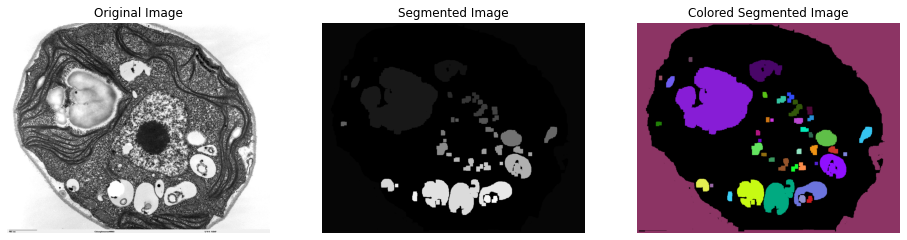

In [72]:
new_img = np.copy(cell.img)
new_img[new_img>=70]=255
new_img[new_img<70]=0

for i in range(3):
    new_img = erossion(new_img, 5,-1,1)
for i in range(3):
    new_img = dilation(new_img, 5,-1,1)

new_img,colored_img = connected_component(new_img, 5)
ss.print_img_subplot(1,3,[16,16],3,[cell.img,new_img,colored_img],["Original Image","Segmented Image","Colored Segmented Image"])

### Flower

In [73]:
flower=Image()
flower.read_local_img("../images/flower.jpeg")
flower.img=cv2.cvtColor(flower.img,cv2.COLOR_BGR2GRAY)

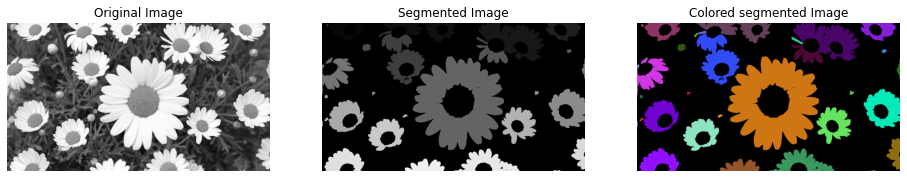

In [74]:
new_img = np.copy(flower.img)
new_img[new_img>=175]=255
new_img[new_img<175]=0

for i in range(3):
    new_img = erossion(new_img, 5,-1,1)
for i in range(3):
    new_img = dilation(new_img, 5,-1,1)

new_img,colored_img = connected_component(new_img, 5)
ss.print_img_subplot(1,3,[16,16],3,[flower.img,new_img,colored_img],["Original Image","Segmented Image","Colored segmented Image"])


## part 2

### Prep

In [75]:
objects=Image()
objects.read_local_img("../images/objects.png")
objects.img=cv2.cvtColor(objects.img,cv2.COLOR_BGR2GRAY)
img_with_holes=objects.img


In [76]:
fil=[[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[1, 1, 1, 1, 1, 1, 1, 1, 1],[0, 0, 0, 0, 0, 0, 0, 0, 0],[0, 0, 0, 0, 0, 0, 0, 0, 0]]
imgo=dilation(objects.img,9,1,fil)
img_with_no_holes=erossion(imgo,9,-1,1)

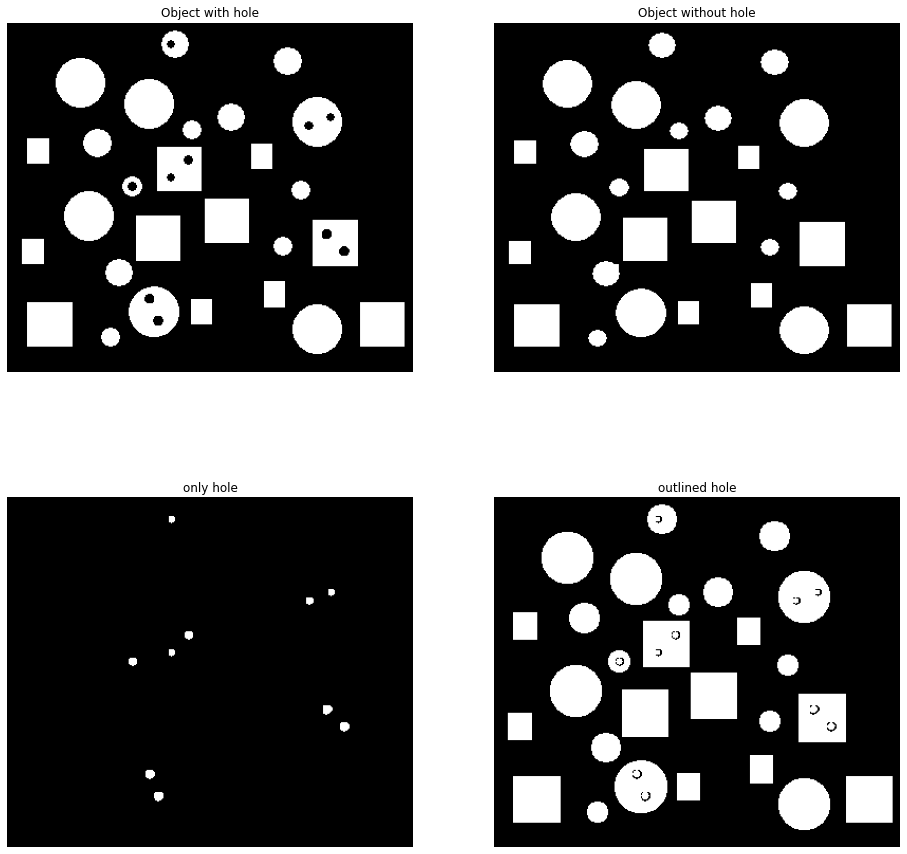

In [77]:
img_diff = img_with_no_holes - img_with_holes
img_diff[img_diff<0]=0
img_diff = dilate(erosion(img_diff,6,6,1),6,6,1)
img_diff2=dilation(objects.img,3,-1,2)//2+img_diff//2
img_diff2=img_diff2.astype(np.uint8)
img_diff2[img_diff2==127]=255
img_diff2[img_diff2<255]=0
ss.print_img_subplot(2,2,[16,16],4,[img_with_holes,img_with_no_holes,img_diff,img_diff2],["Object with hole","Object without hole","only hole","outlined hole"])

### Using contours

Number of objects with holes: 6
Number of hole: 10
Number of squares: 11
Number of circles: 16
Number of squares with holes: 2
Number of squares with no holes: 9
Number of circles with  holes: 4
Number of circles with no holes: 12


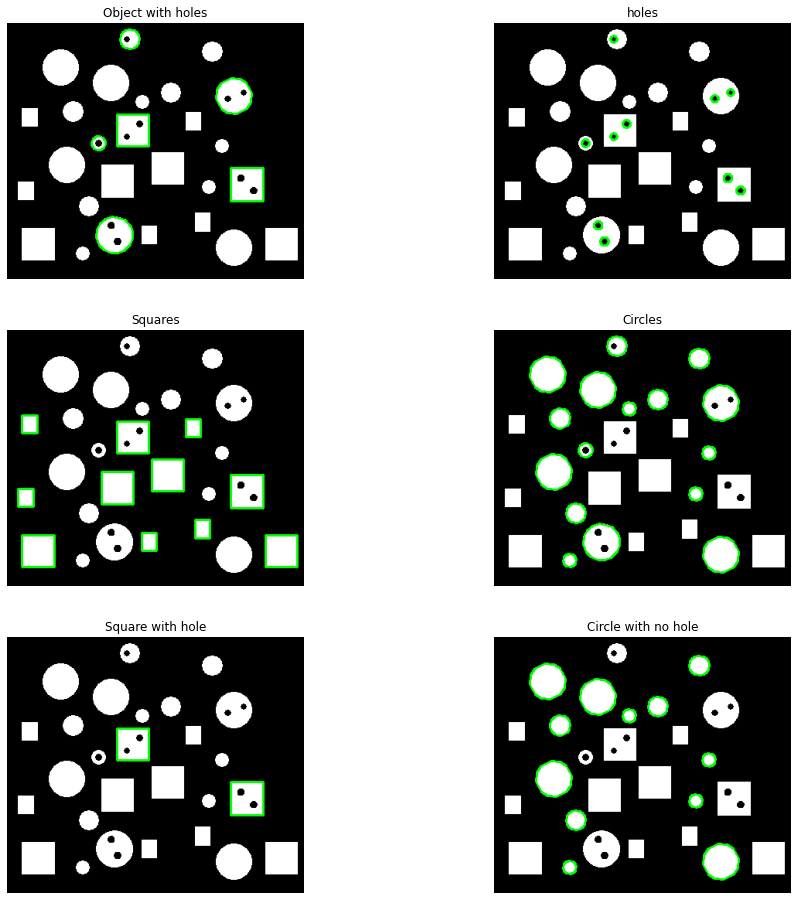

In [78]:
tt1=delayer_img(img_with_holes,img_with_holes,img_with_holes)
tt2=delayer_img(img_with_holes,img_with_holes,img_with_holes)
tt3=delayer_img(img_with_holes,img_with_holes,img_with_holes)
tt4=delayer_img(img_with_holes,img_with_holes,img_with_holes)
tt5=delayer_img(img_with_holes,img_with_holes,img_with_holes)
tt6=delayer_img(img_with_holes,img_with_holes,img_with_holes)
gray = cv2.cvtColor(tt1, cv2.COLOR_BGR2GRAY)

contours,hierarchy = cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
par=[]
hol=[]
obh=0
hh=0
sq=0
ci=0
sqr=0
cir=0
l=0
for i in hierarchy[0]:
    if(i[3]==-1):
        par.append(l)
    l+=1
l=0
for i in hierarchy[0]:
    if(i[3] in par):
        hh+=1
        hol.append(l)
    l+=1

l=0
for i in contours:
    approx=cv2.approxPolyDP(i,0.01*cv2.arcLength(i,True),True)
    x=approx.ravel()[0]
    y=approx.ravel()[1]
    if l in hol:
        cv2.drawContours(tt6, [approx], 0, (0, 255, 0), 2)
    if hierarchy[0][l][3]==-1:
        if len(approx)==4:
            cv2.drawContours(tt1, [approx], 0, (0, 255, 0), 2)
            sq+=1
            if hierarchy[0][l][2]!=-1:
                cv2.drawContours(tt3, [approx], 0, (0, 255, 0), 2)
                cv2.drawContours(tt5, [approx], 0, (0, 255, 0), 2)
                sqr+=1
                obh+=1
        else :
            cv2.drawContours(tt2, [approx], 0, (0, 255, 0), 2)
            ci+=1
            if hierarchy[0][l][2]==-1:
                cv2.drawContours(tt4, [approx], 0, (0, 255, 0), 2)
                cir+=1
            else:
                cv2.drawContours(tt5, [approx], 0, (0, 255, 0), 2)
                obh+=1
    l+=1
print("Number of objects with holes:",obh)
print("Number of hole:",hh)
print("Number of squares:",sq)
print("Number of circles:",ci)
print("Number of squares with holes:",sqr)
print("Number of squares with no holes:",sq-sqr)
print("Number of circles with  holes:",ci-cir)
print("Number of circles with no holes:",cir)
ss.print_img_subplot(3,2,[16,16],6,[tt5,tt6,tt1,tt2,tt3,tt4],["Object with holes","holes","Squares","Circles","Square with hole","Circle with no hole"]) 

### Without using contours

In [79]:
def dfs2(i,j,img,vis):
    global ctr
    if(i<0 or i>=img.shape[0] or j<0 or j>=img.shape[1] or vis[i][j]==1 or img[i][j]==0):
        return
    else:
        vis[i][j]=1
        if img[i][j]!=0:
            dfs2(i+1,j,img,vis)
            dfs2(i-1,j,img,vis)
            dfs2(i,j+1,img,vis)
            dfs2(i,j-1,img,vis)
            dfs2(i+1,j+1,img,vis)
            dfs2(i-1,j-1,img,vis)
            dfs2(i-1,j+1,img,vis)
            dfs2(i+1,j-1,img,vis)

def dfs22(i,j,img,re,vis,c):
    global ctr
    if(i<0 or i>=img.shape[0] or j<0 or j>=img.shape[1] or vis[i][j]==1 or img[i][j]==0):
        return 1
    else:
        vis[i][j]=1
        re[i][j]=c
        vall=0
        if img[i][j]!=0:
            vall+=dfs22(i+1,j,img,re,vis,c)
            vall+=dfs22(i-1,j,img,re,vis,c)
            vall+=dfs22(i,j+1,img,re,vis,c)
            vall+=dfs22(i,j-1,img,re,vis,c)
            vall+=dfs22(i+1,j+1,img,re,vis,c)
            vall+=dfs22(i-1,j-1,img,re,vis,c)
            vall+=dfs22(i-1,j+1,img,re,vis,c)
            vall+=dfs22(i+1,j-1,img,re,vis,c)
            # print(vall)
        return vall

def count_obj(img,co=255):
    cc = 0
    vi = np.zeros((img.shape[0],img.shape[1]))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if vi[i][j]==0 and img[i][j]==co:
                dfs2(i,j,img,vi)
                cc+=1
    return cc

def count_obj2(img,co=255):
    cc = 1
    dd = []
    re = np.zeros((img.shape[0],img.shape[1]))
    vi = np.zeros((img.shape[0],img.shape[1]))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if vi[i][j]==0 and img[i][j]==co:
                kkk=[]
                kkk.append(dfs22(i,j,img,re,vi,cc))
                kkk.append(cc-1)
                dd.append(kkk)
                cc+=1
    return cc-1,dd,re


In [80]:
def dfs(i,j,img,re,vis):
    if(i<0 or i>=img.shape[0] or j<0 or j>=img.shape[1] or vis[i][j]==1 or img[i][j]==0):
        return
    else:
        vis[i][j]=1
        if img[i][j]!=0:
            re[i][j]=255
            dfs(i+1,j,img,re,vis)
            dfs(i-1,j,img,re,vis)
            dfs(i,j+1,img,re,vis)
            dfs(i,j-1,img,re,vis)
            dfs(i+1,j+1,img,re,vis)
            dfs(i-1,j-1,img,re,vis)
            dfs(i-1,j+1,img,re,vis)
            dfs(i+1,j-1,img,re,vis)

#### objects with holes

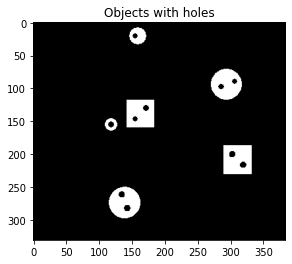

Number of objects with holes: 6


In [81]:
arr=[]
for i in range(img_diff.shape[0]):
    for j in range(img_diff.shape[1]):
        if img_diff[i][j]==255:
            arr.append([i,j])
wholes=np.copy(img_with_holes)
cc=0
re=np.zeros(wholes.shape)
vis=np.zeros(wholes.shape)
for i in range(wholes.shape[0]):
    for j in range(wholes.shape[1]):
        if [i,j] in arr and vis[i][j]==0:
            re[i][j]=255&wholes[i][j]
            cc+=1
            dfs(i,j,wholes,re,vis)
            dfs(i+1,j,wholes,re,vis)
            dfs(i,j+1,wholes,re,vis)
            dfs(i,j-1,wholes,re,vis)
            dfs(i-1,j,wholes,re,vis)
            dfs(i+1,j+1,wholes,re,vis)
            dfs(i-1,j+1,wholes,re,vis)
            dfs(i+1,j-1,wholes,re,vis)
            dfs(i-1,j-1,wholes,re,vis)
img_hole=vis.astype(np.uint8)
plt.imshow(img_hole,cmap='gray')
plt.title("Objects with holes")
plt.show()
print("Number of objects with holes:",count_obj(img_hole,1))

#### squares

In [82]:
k=20
w=np.zeros((k,1))
w.fill(1)
g=np.array(w).astype(np.uint8)
img2=cv2.Sobel(img_with_holes,cv2.CV_8U,1,0,ksize=3)
img=cv2.erode(img2,g,iterations=1)


The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.
Number of Squares: 11


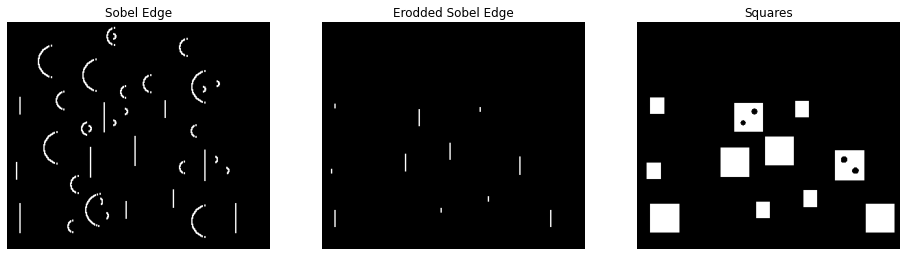

In [83]:
arr=[]
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        if img[i][j]==255:
            arr.append([i,j])
wholes=np.copy(img_with_holes)
cc=0
re=np.zeros(wholes.shape)
vis=np.zeros(wholes.shape)
for i in range(wholes.shape[0]):
    for j in range(wholes.shape[1]):
        if [i,j] in arr and vis[i][j]==0:
            re[i][j]=255&wholes[i][j]
            cc+=1
            dfs(i,j,wholes,re,vis)
            dfs(i+1,j,wholes,re,vis)
            dfs(i,j+1,wholes,re,vis)
            dfs(i,j-1,wholes,re,vis)
            dfs(i-1,j,wholes,re,vis)
            dfs(i+1,j+1,wholes,re,vis)
            dfs(i-1,j+1,wholes,re,vis)
            dfs(i+1,j-1,wholes,re,vis)
            dfs(i-1,j-1,wholes,re,vis)
img_sq=vis.astype(np.uint8)
ss.print_img_subplot(1,3,[16,16],3,[img2,img,img_sq],["Sobel Edge","Erodded Sobel Edge","Squares"])
print("Number of Squares:",count_obj(img_sq,1))

#### squares with holes

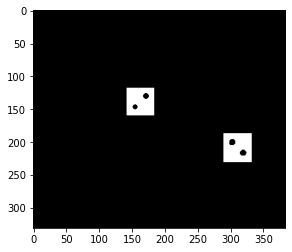

Number of Squares with holes: 2


In [84]:
img_sq_ho = img_hole&img_sq
plt.imshow(img_sq_ho,cmap="gray")
plt.show()
print("Number of Squares with holes:",count_obj(img_sq_ho,1))

#### circles with no holes

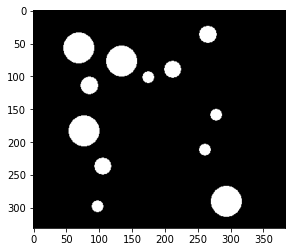

Number of Circles without holes: 12


In [85]:
img_circle = img_with_holes^img_sq*255
img_circle2 = img_circle^img_hole*255
img_circle3 = img_circle2&img_circle
img_circle = img_circle3.astype(np.uint8)
plt.imshow(img_circle,cmap='gray')
plt.show()
print("Number of Circles without holes:",count_obj(img_circle,255))

#### final answer

Number of objects with holes: 6
Number of squares: 11
Number of squares with holes: 2
Number of circles with no holes: 12


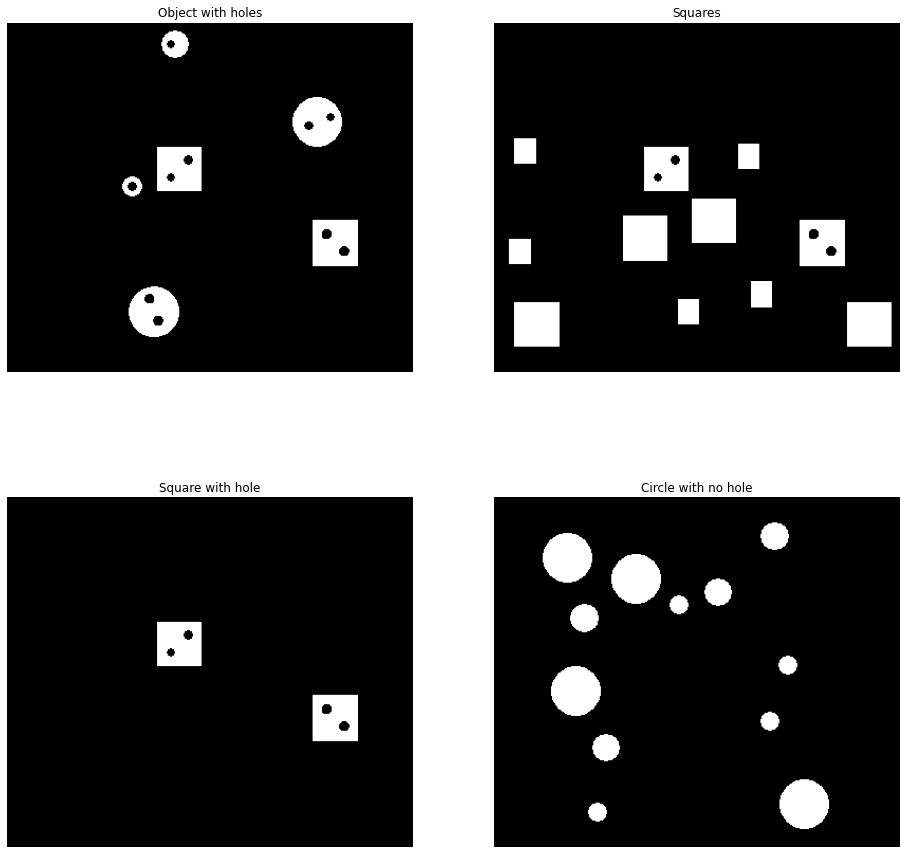

In [86]:
print("Number of objects with holes:",count_obj(img_hole,1))
print("Number of squares:",count_obj(img_sq,1))
print("Number of squares with holes:",count_obj(img_sq_ho,1))
print("Number of circles with no holes:",count_obj(img_circle,255))
ss.print_img_subplot(2,2,[16,16],4,[img_hole,img_sq,img_sq_ho,img_circle],["Object with holes","Squares","Square with hole","Circle with no hole"]) 

## part 3

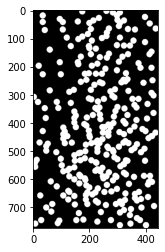

In [87]:
circles = Image()
circles.read_local_img("../images/circles.jpg")
circles.img=cv2.cvtColor(circles.img,cv2.COLOR_BGR2GRAY)
circles.img[circles.img>220]=255
circles.img[circles.img<220]=0
plt.imshow(circles.img,cmap='gray')
plt.show()

### circles touching boundaries

In [88]:
def boundary_pixel(img,win):
    arr = []
    for i in range(img.shape[1]):
        j = 0
        while j<win:
            if img[j][i]:
                arr.append(img[j][i])
            j += 1
        j = img.shape[0]-1
        while(j>img.shape[0]-win):
            if img[j][i] :
                arr.append(img[j][i])
            j -= 1
    for i in range(img.shape[0]):
        j = 0
        while j<win:
            if img[i][j]:
                arr.append(img[i][j])
            j += 1
        j = img.shape[1]-1
        while(j>img.shape[1]-win):
            if img[i][j]:
                arr.append(img[i][j])
            j -= 1
    return np.unique(np.array(arr))

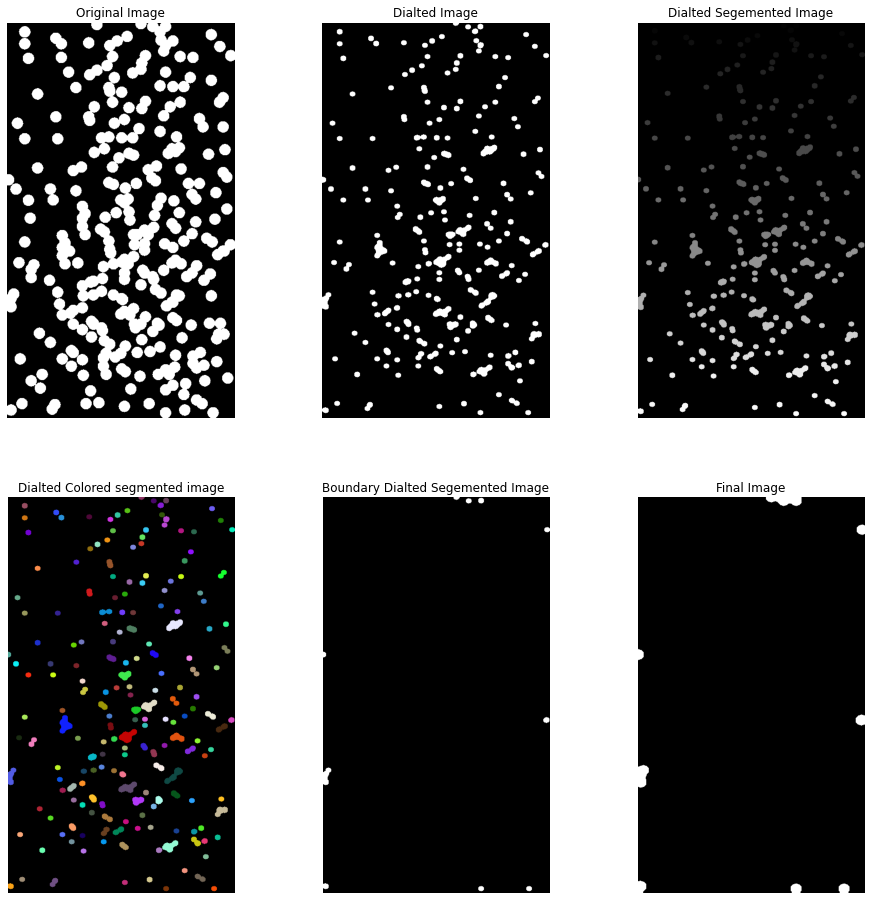

In [89]:
scon_img=np.copy(circles.img)
dilated_con_img = dilate(erosion(scon_img,11,11,2),11,11,1)
con_img,colored_img=connected_component(dilated_con_img,5)
arr=boundary_pixel(con_img,5)
seg=np.copy(con_img)
for i in range(con_img.shape[0]):
    for j in range(con_img.shape[1]):
        if con_img[i][j] in arr:
            con_img[i][j]=255
        elif con_img[i][j]!=255:
            con_img[i][j]=0
final = erosion(dilate(con_img,11,11,2),11,11,1)
ss.print_img_subplot(2,3,[16,16],6,[scon_img,dilated_con_img,seg,colored_img,con_img,final],["Original Image","Dialted Image","Dialted Segemented Image","Dialted Colored segmented image","Boundary Dialted Segemented Image","Final Image"])


### overlapping circles

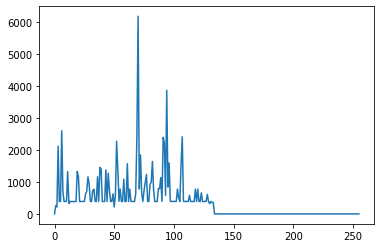

In [90]:
non_overlap_id = []
seg,_=connected_component(circles.img,5)
his=my_histogram(seg)
his[0]=0
plt.plot(his)
plt.show()
th=394
for i in range(seg.shape[0]):
    for j in range(seg.shape[1]):
        if seg[i][j] not in non_overlap_id and his[seg[i][j]]<th:
            non_overlap_id.append(seg[i][j])
            

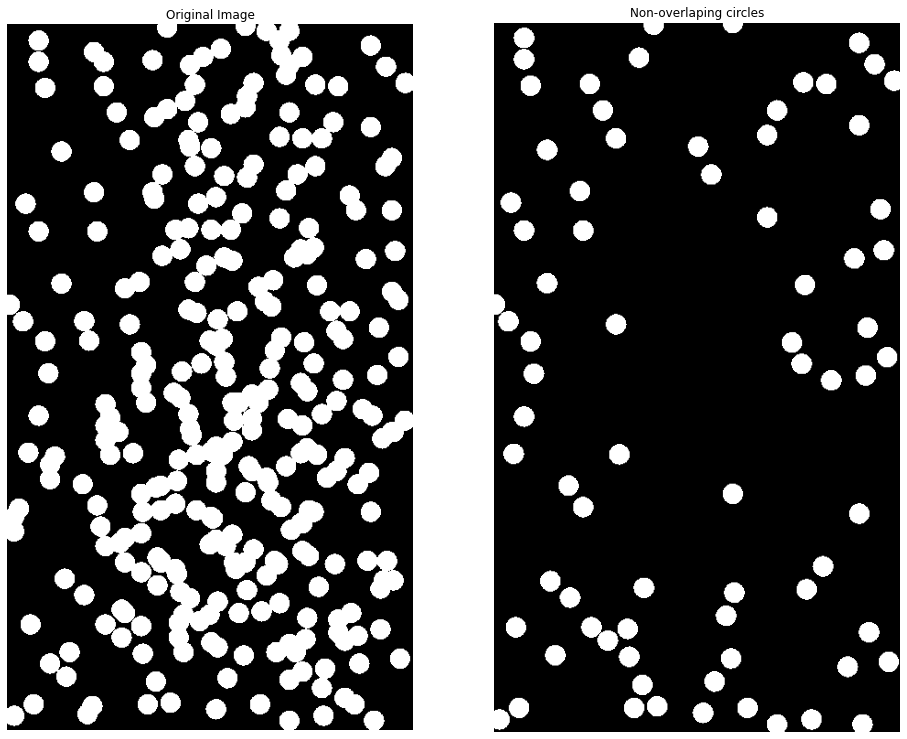

In [91]:
noi=np.zeros(seg.shape)
for i in range(noi.shape[0]):
    for j in range(noi.shape[1]):
        if seg[i][j] not in non_overlap_id:
            noi[i][j]=0
        else:
            noi[i][j]=255
        if seg[i][j]==0:
            noi[i][j]=0
ss.print_img_subplot(1,2,[16,16],2,[circles.img,noi],["Original Image","Non-overlaping circles"])

### non overlapping circles


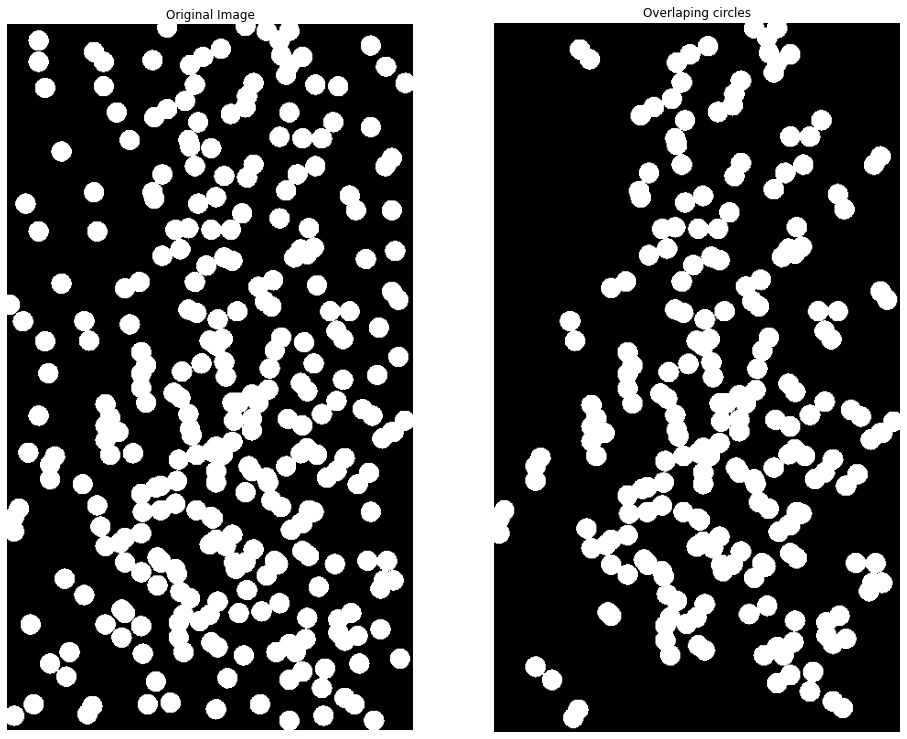

In [92]:
noi=np.zeros(seg.shape)
for i in range(noi.shape[0]):
    for j in range(noi.shape[1]):
        if seg[i][j] in non_overlap_id:
            noi[i][j]=0
        else:
            noi[i][j]=255
ss.print_img_subplot(1,2,[16,16],2,[circles.img,noi],["Original Image","Overlaping circles"])

# Question 3

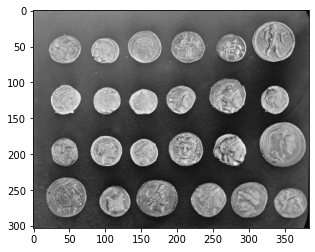

In [93]:
coin = Image()
coin.read_local_img("../images/coins.png")
coin.img=cv2.cvtColor(coin.img,cv2.COLOR_BGR2GRAY)
plt.imshow(coin.img,cmap='gray')
plt.show()

## part 1

### A

In [94]:
def thresholding(img,lim):
    arr=np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if(img[i][j]>=lim):
                arr[i][j]=255
    return arr.astype(np.uint8)

In [95]:
import plotly.express as px
import pandas as pd

arr=my_histogram(coin.img)
arr=pd.DataFrame(arr)
fig = px.line(arr)
fig.show()


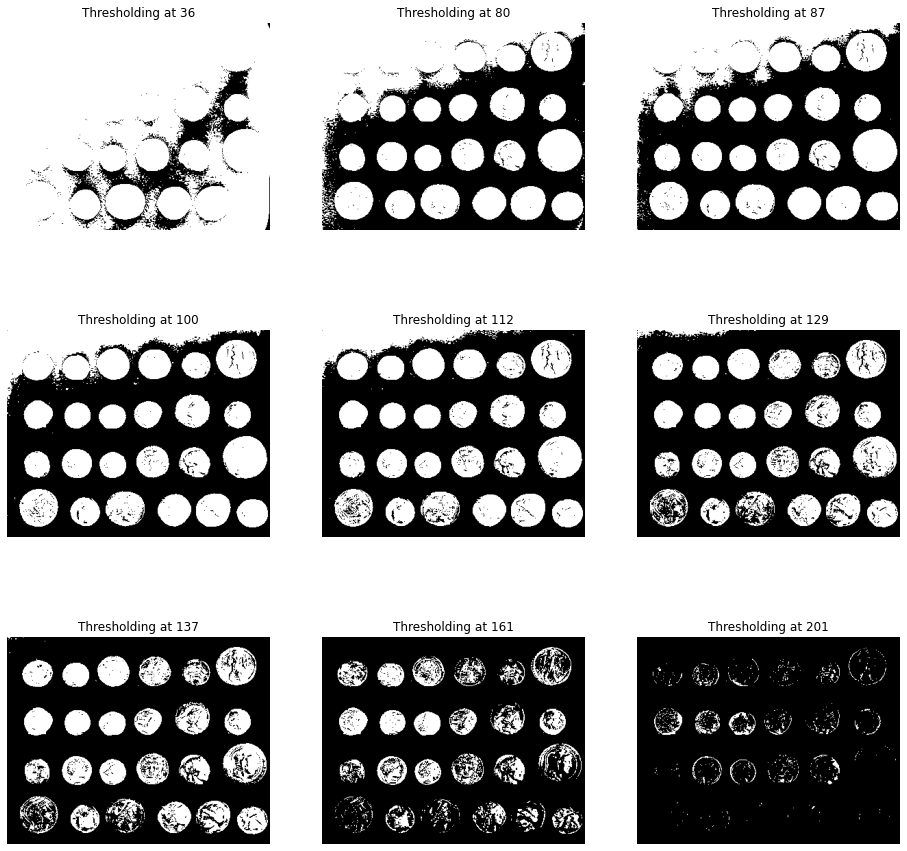

In [96]:
arr=[36,80,87,100,112,129,137,161,201]
bb=[]
cc=[]
for i in range(len(arr)):
    bb.append(thresholding(coin.img,arr[i]))
    cc.append("Thresholding at "+ str(arr[i]))
ss.print_img_subplot(3,3,[16,16],9,bb,cc)

Number of coins: 24


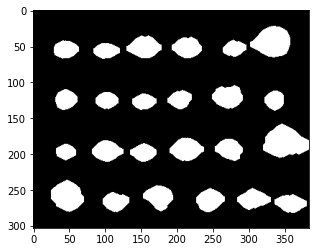

In [97]:
img=thresholding(coin.img,161)
img=dilate(img,7,7,4)
img=erosion(img,7,7,8)
img=dilate(img,5,5,3)
print("Number of coins:",count_obj(img,255))
plt.imshow(img,cmap="gray")
plt.show()

### B

In [98]:
def otsu(img):
    final_thresh = -1
    final_value = -1
    his=my_histogram(img)
    tot=0
    mtot=0
    for i in range(0,256):
        tot+=his[i]
        mtot+=i*his[i]
    mtot=mtot/tot
    his=his.astype(int)
    for k in range(len(his)):
        p1=0
        p2=0
        m1=0
        m2=0
        for i in range(k+1):
            p1+=his[i]
            m1+=i*his[i]
        for i in range(k+1,256):
            p2+=his[i]
            m2+=i*his[i]
        if p1!=0 and p2!=0:
            m1=m1/p1
            m2=m2/p2
            p1=p1/tot
            p2=p2/tot
            value=(p1*(m1-mtot)**2+p2*(m2-mtot)**2)
            if value > final_value:
                final_thresh = k
                final_value = value
    print("Final Threshold is",final_thresh)
    return thresholding(img,final_thresh)


In [99]:
def colorize(img,x,y):
    arr=[]
    arr.append([x,y])
    re=np.copy(img)
    vis=np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if [i,j] in arr and vis[i][j]==0:
                re[i][j]=255&img[i][j]
                dfs3(i,j,img,re,vis)
                dfs3(i+1,j,img,re,vis)
                dfs3(i,j+1,img,re,vis)
                dfs3(i,j-1,img,re,vis)
                dfs3(i-1,j,img,re,vis)
                dfs3(i+1,j+1,img,re,vis)
                dfs3(i-1,j+1,img,re,vis)
                dfs3(i+1,j-1,img,re,vis)
                dfs3(i-1,j-1,img,re,vis)
    img_hole=re.astype(np.uint8)
    return img_hole

def colorise(img,x,y):
    vis=np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if i>x and j>y:
                vis[i][j]=img[i][j]
    img_hole=vis.astype(np.uint8)
    return img_hole

def dfs3(i,j,img,re,vis):
    if(i<0 or i>=img.shape[0] or j<0 or j>=img.shape[1] or vis[i][j]==1 or img[i][j]==0):
        return
    else:
        vis[i][j]=1
        if img[i][j]!=0:
            re[i][j]=0
            dfs3(i+1,j,img,re,vis)
            dfs3(i-1,j,img,re,vis)
            dfs3(i,j+1,img,re,vis)
            dfs3(i,j-1,img,re,vis)
            dfs3(i+1,j+1,img,re,vis)
            dfs3(i-1,j-1,img,re,vis)
            dfs3(i-1,j+1,img,re,vis)
            dfs3(i+1,j-1,img,re,vis)

Final Threshold is 107
Number of coins: 24


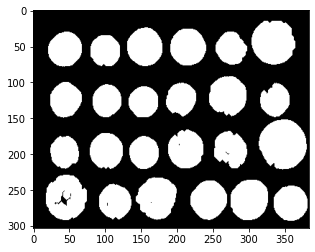

In [100]:
imgot=otsu(coin.img)
imgo=np.copy(imgot)
imgo=erosion(imgo,5,5,1)
imgo=colorize(imgo,20,1)
imgo=colorize(imgo,250,5)
imgo=colorise(imgo,20,20)
imgo=dilate(imgo,3,5,3)
print("Number of coins:",count_obj(imgo,255))
plt.imshow(imgo,cmap="gray")
plt.show()


Number of disconnected parts: 98
Number of coins: 24


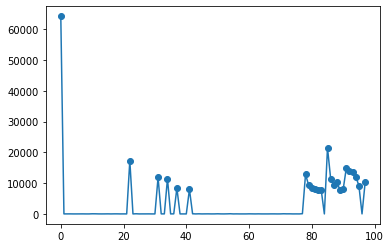

In [101]:
print("Number of disconnected parts:",count_obj(imgot,255))
aa,bb,re=count_obj2(imgot,255)
bbb=[x[0] for x in bb]
aaa=[]
aab=[]
for i in bb:
    if i[0]>200:
        aaa.append(i[0])
        aab.append(i[1])
# plt.imshow(re,cmap="gray")
# plt.show()
print("Number of coins:",len(aaa))
plt.plot(bbb)
plt.scatter(aab,aaa)
plt.show()

+ ### In thresholding with morphological operations we can get rid of noise and than calculate the number of disconnected components.
+ ### In otsu i have used a threshold value of the number of pixels in a disconnected component.


### C

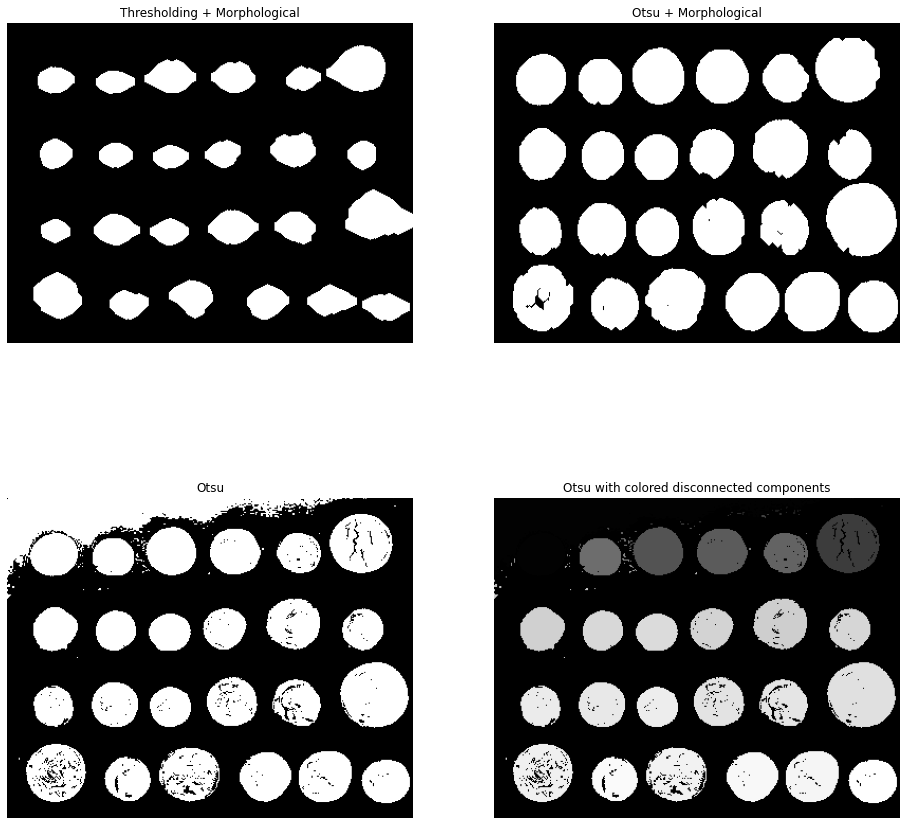

In [102]:
ss.print_img_subplot(2,2,[16,16],4,[img,imgo,imgot,re],["Thresholding + Morphological","Otsu + Morphological","Otsu","Otsu with colored disconnected components"])

## part 2

In [103]:
def magic2(ker,img):
    kk=len(ker)
    if kk%2==0:
        ker1=np.zeros((kk+1,kk+1))
        for i in range(1,kk+1):
            for j in range(1,kk+1):
                ker1[i][j]=ker[i-1][j-1]
        ker=ker1
    kk=kk//2
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(kk,img.shape[0]-2):
        for j in range(2,img.shape[1]-kk):
            val=0
            for aa in range(-kk,kk+1):
                for bb in range(-kk,kk+1):
                    val+=img[i+aa][j+bb]*ker[kk+aa][kk+bb]
            arr[i][j]=val
    return arr

def cc(img):
    mini=np.min(img)
    maxi=np.max(img)
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            arr[i][j]=(img[i][j]-mini)*255.0/(maxi-mini)
    return arr

def magic(ker,img):
    arr=np.zeros
    k=len(ker)
    arr=np.zeros((img.shape[0],img.shape[1]))
    for i in range(1,img.shape[0]):
        for j in range(1,img.shape[1]):
            val=0
            for m in range(0,k):
                for n in range(0,k):
                    if(i+m-1>=0 and i+m-1<img.shape[0] and j+n-1>=0 and j+n-1<img.shape[1]):
                        val+=(img[i+m-1][j+n-1]*ker[m][n])
                    else:
                        val+=0
            if(val>255):
                val=255
            elif(val<0):
                val=0
            arr[i][j]=val
    return arr
    # return arr.astype(np.uint8)

def cclip(img):
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if(img[i][j]<0):
                img[i][j]=0
            if(img[i][j]>255):
                img[i][j]=255
    return img

perwittx = [[-1,0,1],[-1,0,1],[-1,0,1]]
perwitty = [[1,1,1],[0,0,0],[-1,-1,-1]]

sobelx = [[-1,0,1],[-2,0,2],[-1,0,1]]
sobely = [[1,2,1],[0,0,0],[-1,-2,-1]]

robertx = [[0,1],[-1,0]]
roberty = [[1,0],[0,-1]]

lap1 = [[0,1,0],[1,-4,1],[0,1,0]]
lap2 = [[1,1,1],[1,-8,1],[1,1,1]]
ss=Subplot()

### Canny

Number of coins using canny filter: 24


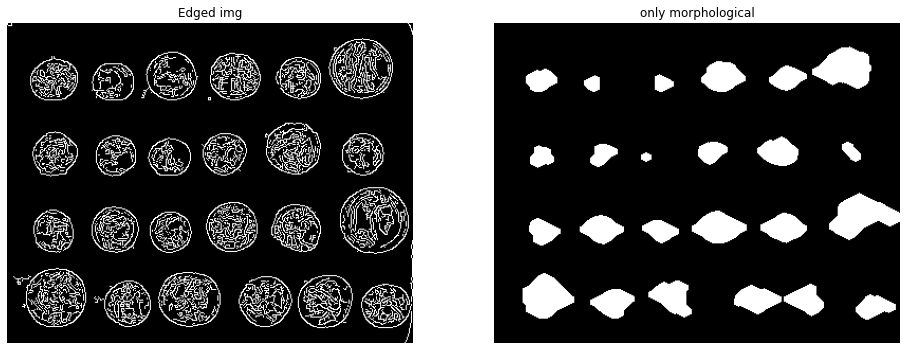

In [104]:
img=cv2.Canny(coin.img,45,200)
imgc=cv2.Canny(coin.img,45,200)
imgc=dilate(imgc,3,3,2)
imgc=erosion(imgc,9,9,1)
imgc=dilate(imgc,5,5,7)
imgc=erosion(imgc,7,7,8)
imgc=dilate(imgc,5,5,2)
print("Number of coins using canny filter:",count_obj(imgc,255))
ss.print_img_subplot(1,2,[16,16],2,[img,imgc],["Edged img","only morphological"])


### Sobel

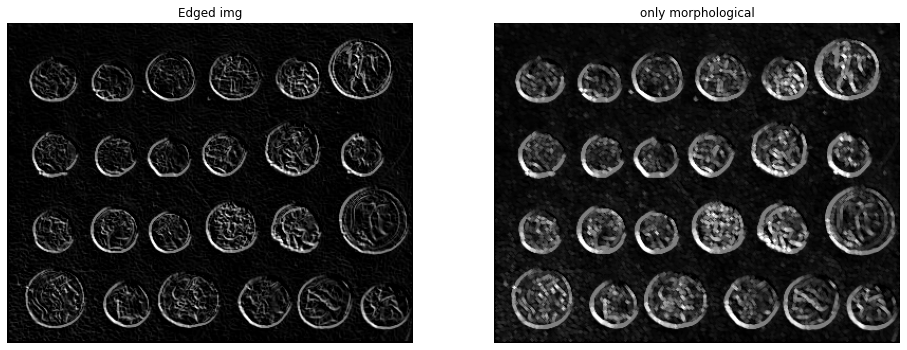

In [105]:
img1=cclip(magic2(sobelx,coin.img))
img2=cclip(magic2(sobely,coin.img))
img3=cclip(((img1+img2)//2))
imgm=dilate(img3,3,3,1)
ss.print_img_subplot(1,2,[16,16],2,[img3,imgm],["Edged img","only morphological"])

### Laplacian

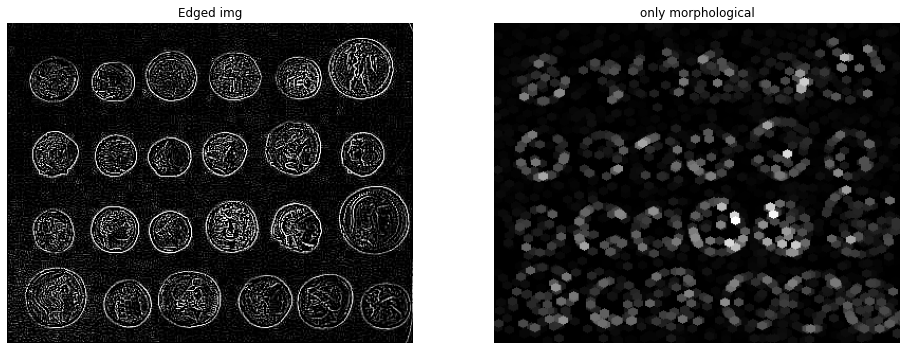

In [106]:
imgl=magic(lap2,coin.img)
imge=erosion(imgl,3,3,1)
imge=dilate(imge,5,5,2)
ss.print_img_subplot(1,2,[16,16],2,[imgl,imge],["Edged img","only morphological"])

### perwitt

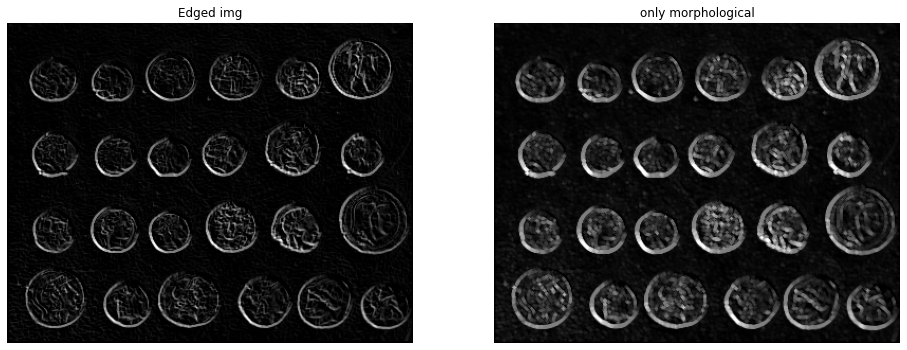

In [107]:
img1=cclip(magic2(perwittx,coin.img))
img2=cclip(magic2(perwitty,coin.img))
img3=cclip(((img1+img2)//2))
imgm=dilate(img3,3,3,1)
ss.print_img_subplot(1,2,[16,16],2,[img3,imgm],["Edged img","only morphological"])

+ #### since canny filter gives output as an binary image it is easier to for performing morphological operation on it which will later helps in coins counting or we can fill the coins in boundary to caluculate it too
+ #### in other edge filters like sobel, laplacian and perwitt we get non binary image and the coin detection and counting in very tough process using only morphological operations and not using any thersholding on them.

## part 3

+ ### coin detecation and counting is easier on a binary image than on a non binary image, wherther we got it from thresholding or canny.
+ ### due to background noise in the image we can get a lot of noise in the image and it is difficult to get rid of it whie after thresholding so we can imposed a limit on min and max of coin area.
+ ### the most effective way to calculate coins in edge detection is boundary filing but it requires binary image (which may need thresholding too)